# Import required packages

In [36]:
from omero.gateway import BlitzGateway, ColorHolder
from omero.model import MaskI
from omero.rtypes import (
    rdouble,
    rint,
    rstring,
)
import omero_rois
import omero
from getpass import getpass
from cellpose import models, utils,plot,io
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = [8, 6]

In [37]:
def find_chan(image,channel):
    
    """
    Finds the specified channel number from the image metadata
    """
    
    for i, chan in enumerate(image.getChannels()):
        #print(i, dic)
        if chan.getLabel() == channel:
            return i
    return -1
# We have a helper function for creating an ROI and linking it to new shapes
def create_roi(img, shapes):
    # create an ROI, link it to Image
    roi = omero.model.RoiI()
    # use the omero.model.ImageI that underlies the 'image' wrapper
    roi.setImage(img._obj)
    for shape in shapes:
        roi.addShape(shape)
    # Save the ROI (saves any linked shapes too)
    return updateService.saveAndReturnObject(roi)

In [38]:
# Load Cellpose
use_GPU = models.use_gpu()
print('>>> GPU activated? %d'%use_GPU)
model = models.Cellpose(gpu=True,model_type='cyto')

** TORCH CUDA version installed and working. **
>>> GPU activated? 1
** TORCH CUDA version installed and working. **
>>>> using GPU


# Login to OMERO

In [39]:
def connect(hostname, username, password):
    """
    Connect to an OMERO server
    :param hostname: Host name
    :param username: User
    :param password: Password
    :return: Connected BlitzGateway
    """
    conn = BlitzGateway(username, password,
                        host=hostname, port=4064, secure=True)
    conn.connect()
    conn.c.enableKeepAlive(6000)
    return conn

HOST = '35.8.197.106'
conn = connect(HOST, input("Username: "),
               getpass("OMERO Password: "))
print("Connected as {}".format(conn.getUser().getName()))

Username: JonathanSakkos
OMERO Password: ········
Connected as JonathanSakkos


# Select the dataset and get its description from the server

In [40]:
def print_obj(obj, indent=0):
    """
    Helper method to display info about OMERO objects.
    Not all objects will have a "name" or owner field.
    """
    print("""%s%s:%s  Name:"%s" (owner=%s)""" % (
        " " * indent,
        obj.OMERO_CLASS,
        obj.getId(),
        obj.getName(),
        obj.getOwnerOmeName()))
    
# Enter dataset number here
dataset = 238
    
for image in conn.getObjects('Image', opts={'dataset': dataset}):
    #print_obj(image)
    print(image.getId())

4309
4310
4311
4312
4313
4314
4315
4316
4317
4318
4319
4320
4321
4322
4323
4324
4325
4326
4327
4328
4329
4330
4331
4332
4333
4334
4335
4336
4337
4338
4339
4340
4341
4342
4343
4344
4345
4346
4347
4348
4349
4350
4351
4352
4353
4354
4355
4356
4357
4358
4359
4360
4361
4362
4363
4364
4365
4366
4367
4368
4369
4370
4371
4372
4373
4374
4375
4376
4377
4378
4379
4380
4381
4382
4383
4384
4385
4386
4387
4388
4399
4400
4401
4402
4403


In [41]:
# Loop through all images and create segmentations

CscB-SPS +IPTG-01.czi 
already contains a mask
CscB-SPS +IPTG-02.czi 
already contains a mask
CscB-SPS +IPTG-03.czi 
already contains a mask
CscB-SPS +IPTG-04.czi 
already contains a mask
CscB-SPS +IPTG-05.czi 
already contains a mask
CscB-SPS +IPTG-06.czi 
already contains a mask
CscB-SPS +IPTG-07.czi 
already contains a mask
CscB-SPS +IPTG-08.czi 
already contains a mask
CscB-SPS +IPTG-09.czi 
already contains a mask
CscB-SPS +IPTG-10.czi 
already contains a mask
CscB-SPS -IPTG-01.czi 
already contains a mask
CscB-SPS -IPTG-02.czi 
already contains a mask
CscB-SPS -IPTG-03.czi 
already contains a mask
CscB-SPS -IPTG-04.czi 
already contains a mask
CscB-SPS -IPTG-05.czi 
already contains a mask
CscB-SPS -IPTG-06.czi 
already contains a mask
CscB-SPS -IPTG-07.czi 
already contains a mask
CscB-SPS -IPTG-08.czi 
already contains a mask
CscB-SPS -IPTG-09.czi 
already contains a mask
CscB-SPS -IPTG-10.czi 
already contains a mask
CscB-SPS-0480-tags-mNG +IPTG-01.czi 
already contains a mask

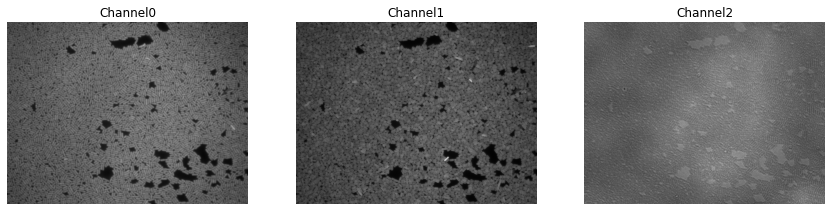

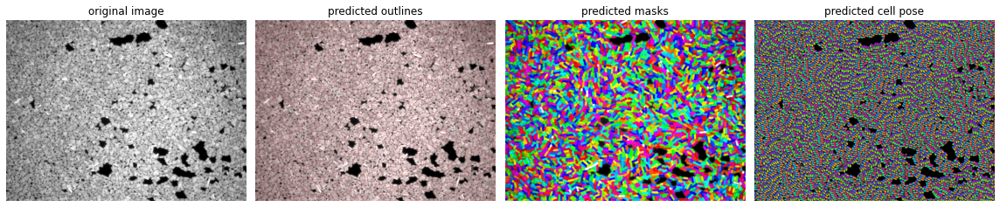

CscB-SPS-0924-tags-mNG -IPTG-03.czi 
processing 1 image(s)
time spent: running network 10.22s; flow+mask computation 101.98
estimated masks for 1 image(s) in 112.30 sec
>>>> TOTAL TIME 112.31 sec


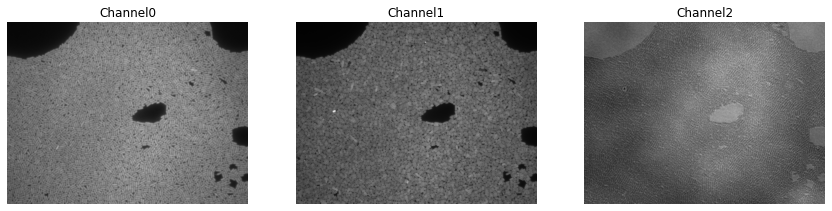

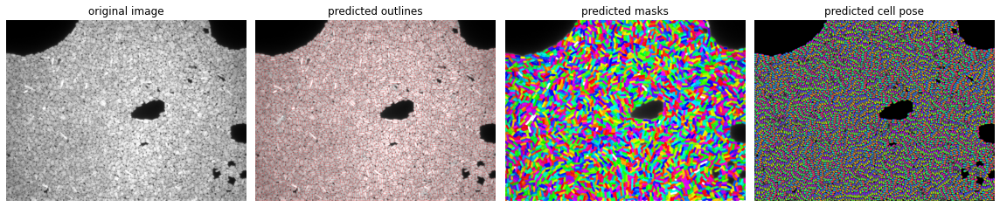

CscB-SPS-0924-tags-mNG -IPTG-04.czi 
processing 1 image(s)
time spent: running network 10.28s; flow+mask computation 107.77
estimated masks for 1 image(s) in 118.14 sec
>>>> TOTAL TIME 118.14 sec


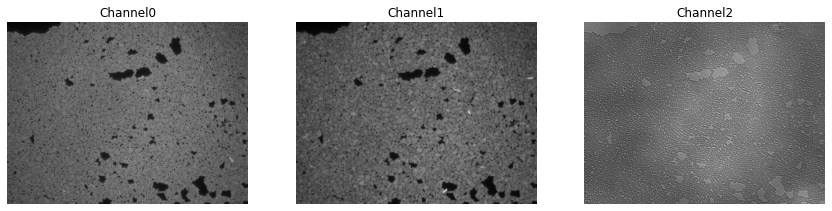

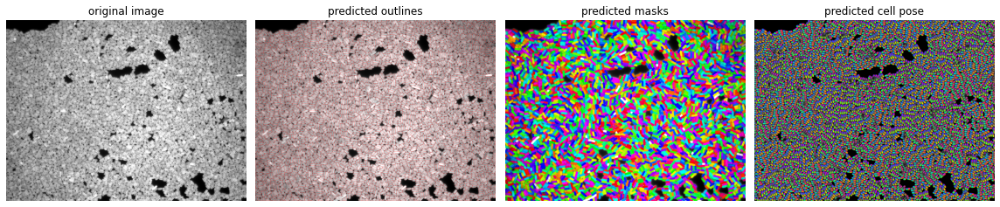

CscB-SPS-0924-tags-mNG -IPTG-05.czi 
processing 1 image(s)
time spent: running network 10.25s; flow+mask computation 109.68
estimated masks for 1 image(s) in 120.03 sec
>>>> TOTAL TIME 120.03 sec


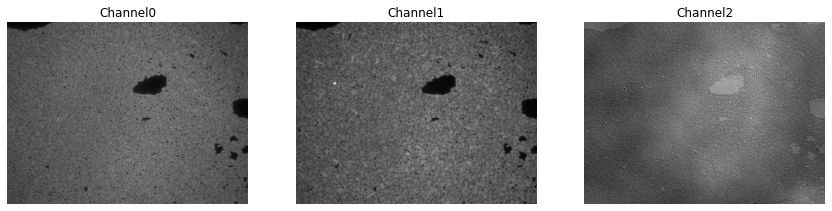

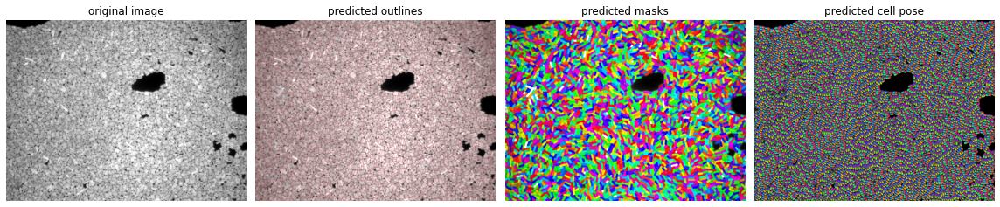

CscB-SPS-0924-tags-mNG -IPTG-06.czi 
processing 1 image(s)
time spent: running network 10.37s; flow+mask computation 107.43
estimated masks for 1 image(s) in 117.91 sec
>>>> TOTAL TIME 117.91 sec


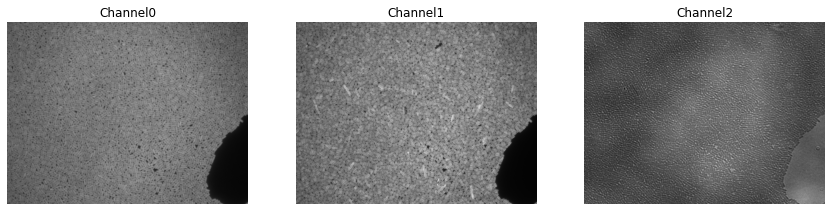

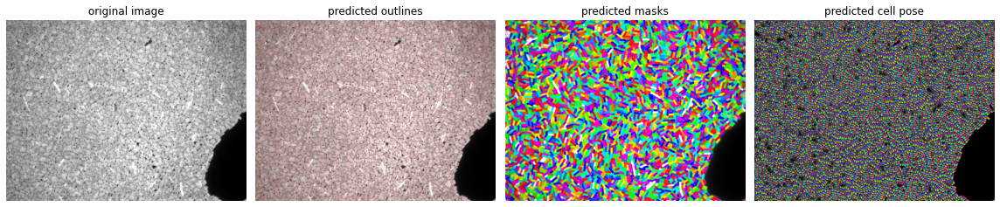

CscB-SPS-0924-tags-mNG -IPTG-07.czi 
processing 1 image(s)
time spent: running network 10.28s; flow+mask computation 119.33
estimated masks for 1 image(s) in 129.71 sec
>>>> TOTAL TIME 129.71 sec


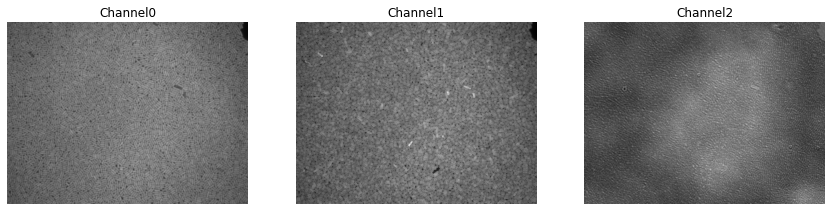

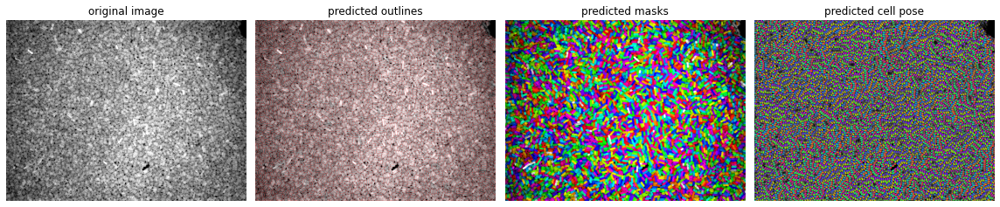

CscB-SPS-0924-tags-mNG -IPTG-08.czi 
processing 1 image(s)
time spent: running network 10.27s; flow+mask computation 90.33
estimated masks for 1 image(s) in 100.70 sec
>>>> TOTAL TIME 100.70 sec


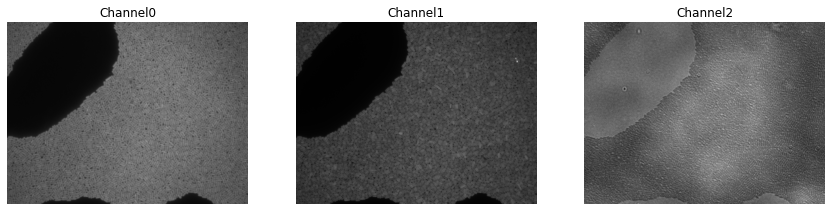

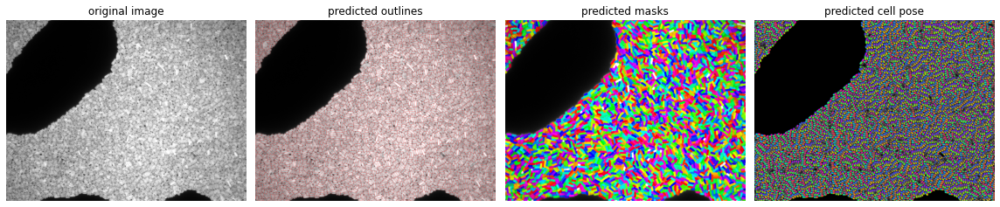

CscB-SPS-0924-tags-mNG -IPTG-09.czi 
processing 1 image(s)
time spent: running network 10.26s; flow+mask computation 88.43
estimated masks for 1 image(s) in 98.79 sec
>>>> TOTAL TIME 98.79 sec


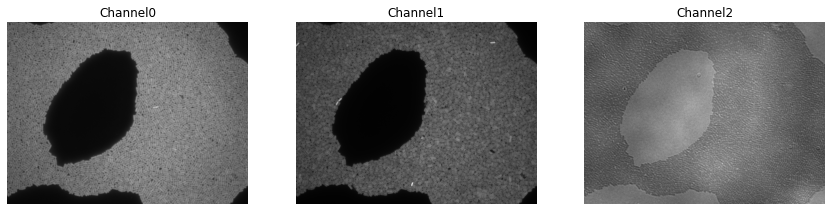

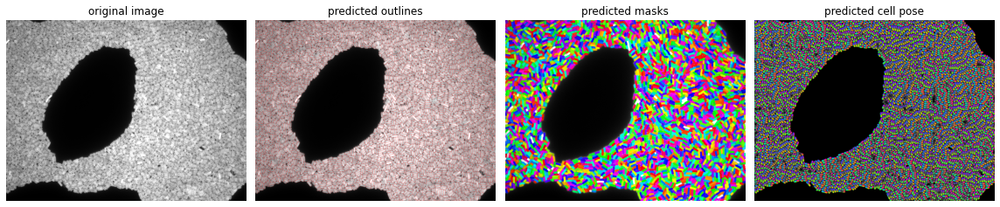

CscB-SPS-0924-tags-mNG -IPTG-10.czi 
processing 1 image(s)
time spent: running network 10.26s; flow+mask computation 91.61
estimated masks for 1 image(s) in 101.96 sec
>>>> TOTAL TIME 101.96 sec


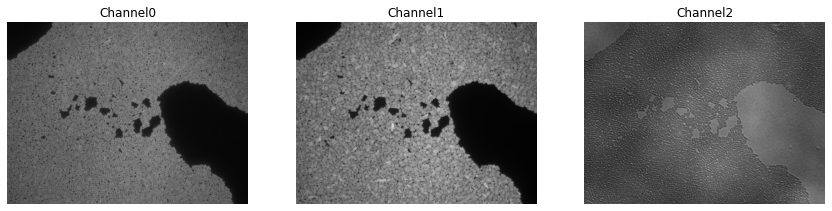

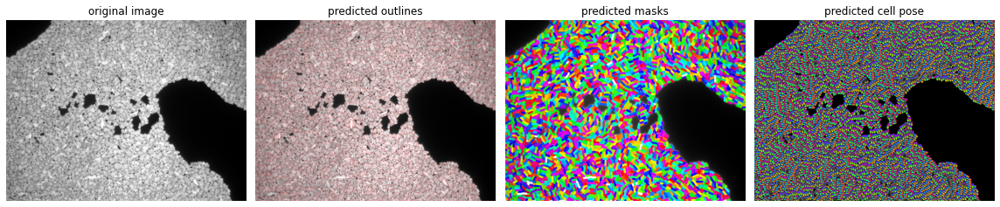

CscB-SPS-1693-tags-mNG +IPTG-01.czi 
processing 1 image(s)
time spent: running network 10.38s; flow+mask computation 71.67
estimated masks for 1 image(s) in 82.16 sec
>>>> TOTAL TIME 82.16 sec


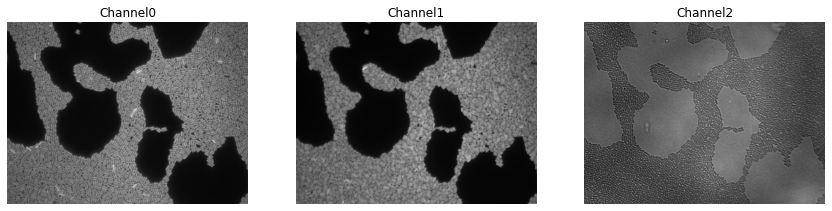

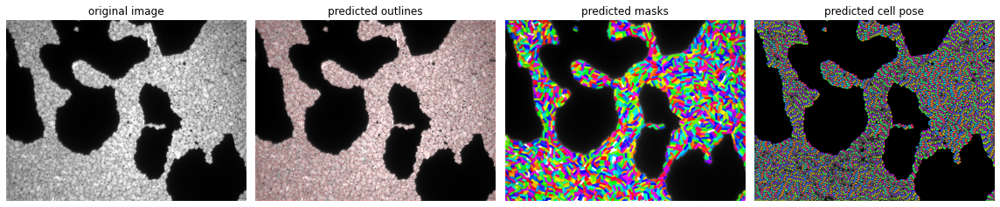

CscB-SPS-1693-tags-mNG +IPTG-02.czi 
processing 1 image(s)
time spent: running network 10.39s; flow+mask computation 114.47
estimated masks for 1 image(s) in 124.98 sec
>>>> TOTAL TIME 124.98 sec


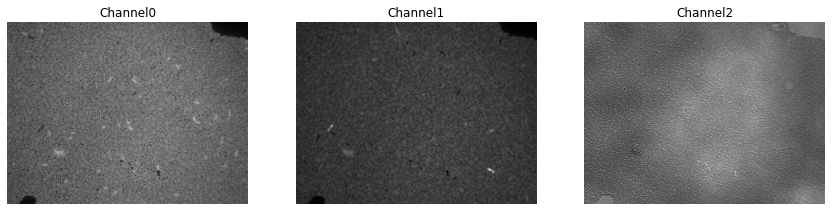

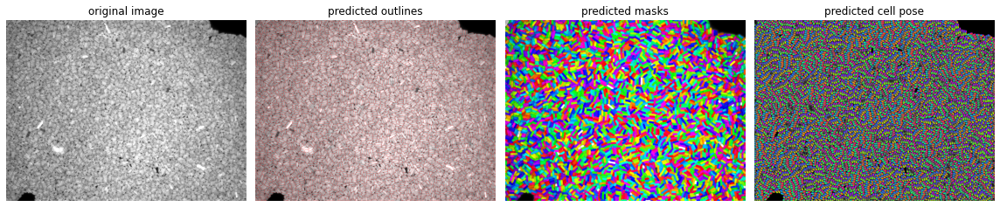

CscB-SPS-1693-tags-mNG +IPTG-03.czi 
processing 1 image(s)
time spent: running network 10.36s; flow+mask computation 81.21
estimated masks for 1 image(s) in 91.67 sec
>>>> TOTAL TIME 91.67 sec


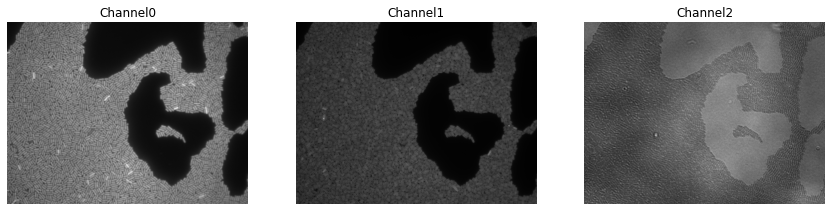

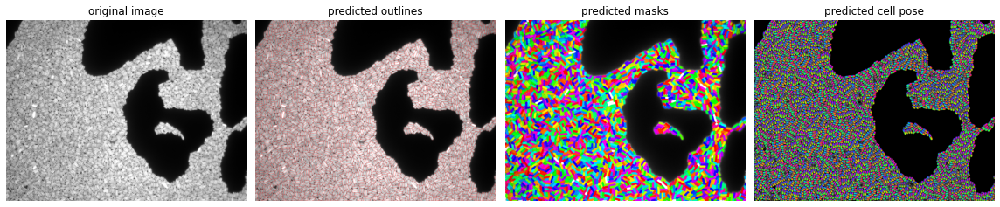

CscB-SPS-1693-tags-mNG +IPTG-04.czi 
processing 1 image(s)
time spent: running network 10.34s; flow+mask computation 106.31
estimated masks for 1 image(s) in 116.75 sec
>>>> TOTAL TIME 116.75 sec


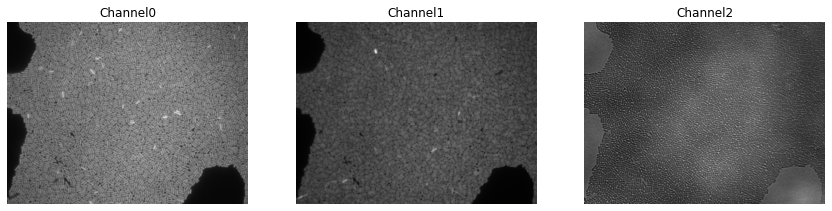

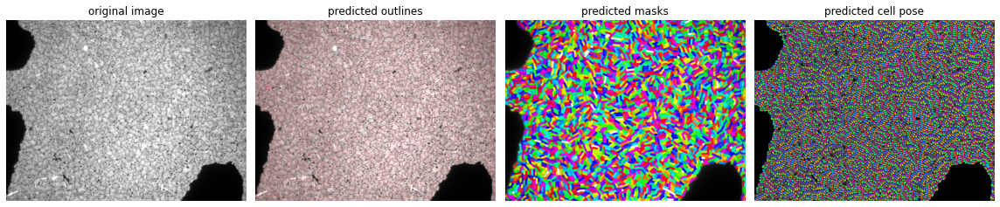

CscB-SPS-1693-tags-mNG +IPTG-05.czi 
processing 1 image(s)
time spent: running network 10.30s; flow+mask computation 82.44
estimated masks for 1 image(s) in 92.85 sec
>>>> TOTAL TIME 92.85 sec


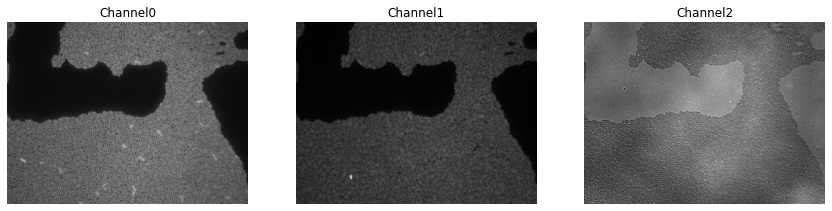

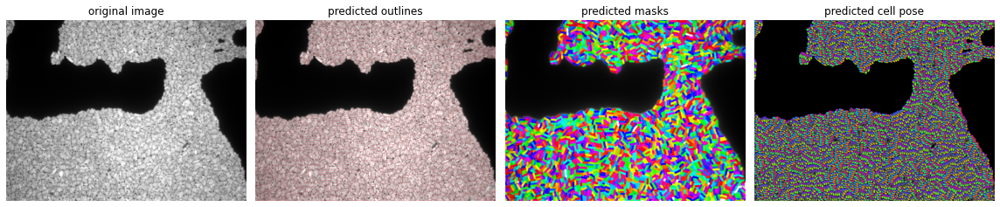

CscB-SPS-1693-tags-mNG +IPTG-06.czi 
processing 1 image(s)
time spent: running network 10.20s; flow+mask computation 83.83
estimated masks for 1 image(s) in 94.12 sec
>>>> TOTAL TIME 94.13 sec


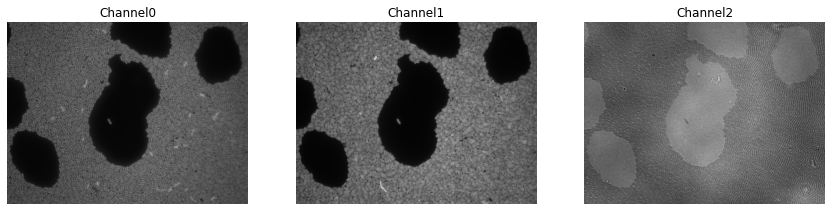

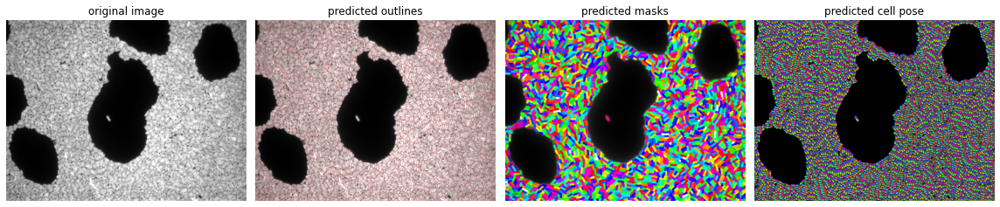

CscB-SPS-1693-tags-mNG +IPTG-07.czi 
processing 1 image(s)
time spent: running network 10.26s; flow+mask computation 96.42
estimated masks for 1 image(s) in 106.79 sec
>>>> TOTAL TIME 106.79 sec


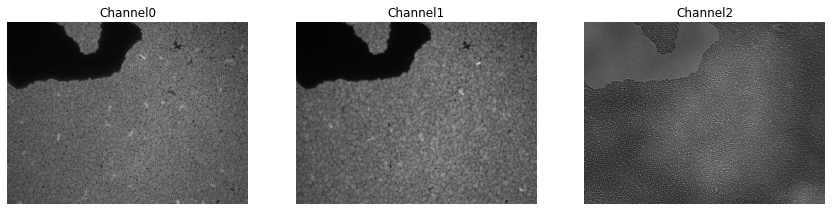

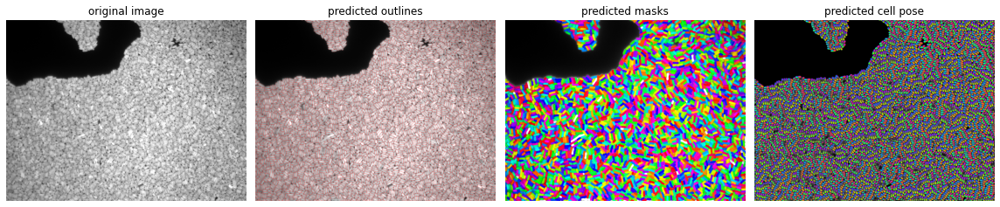

NoMaskFound: No mask found

In [42]:
for image in conn.getObjects('Image', opts={'dataset': dataset}):
    ImageMask = False
    image = conn.getObject("Image", image.getId())
    print(image.getName(), image.getDescription())
    get_ipython().run_line_magic('matplotlib', 'inline')
    # View image channels separately
    pixels = image.getPrimaryPixels()
    channels = image.getChannels()
    plt.figure(figsize=(25, 20))
    size_c = image.getSizeC()
    for idx in range(0, size_c):
        plt.subplot(1, 5, idx+1)
        image_plane = pixels.getPlane(0, idx, 0)
        plt.imshow(image_plane, cmap='gray')
        plt.axis('off')
        plt.title('Channel' + str(idx))
    # Find DsRed for segmentation
    dsred_channel = find_chan(image,'DsRed')
    dsred = pixels.getPlane(0, dsred_channel, 0)
    roi_service = conn.getRoiService()
    result = roi_service.findByImage(image.getId(), None)
    for roi in result.rois:
        for i,s in enumerate(roi.copyShapes()):
            if type(s) == omero.model.MaskI:
                ImageMask = True
                break
    # Segment
    if ImageMask == False:
        masks, flows, styles, diams = model.eval(dsred, diameter=20)
        fig = plt.figure(figsize=(16,5))
        plot.show_segmentation(fig, dsred, masks, flows[0])
        plt.tight_layout()
        plt.show()
        # create segmentation roi
        updateService = conn.getUpdateService()
        msks = omero_rois.masks_from_label_image(masks)
        create_roi(image,msks)
    else:
        print('already contains a mask')
    

In [ ]:
def disconnect(conn):
    """
    Disconnect from an OMERO server
    :param conn: The BlitzGateway
    """
    conn.close()

disconnect(conn)